### Laboratorium 6 - część 1/2

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [34]:
from typing import List
from tqdm.auto import tqdm

import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

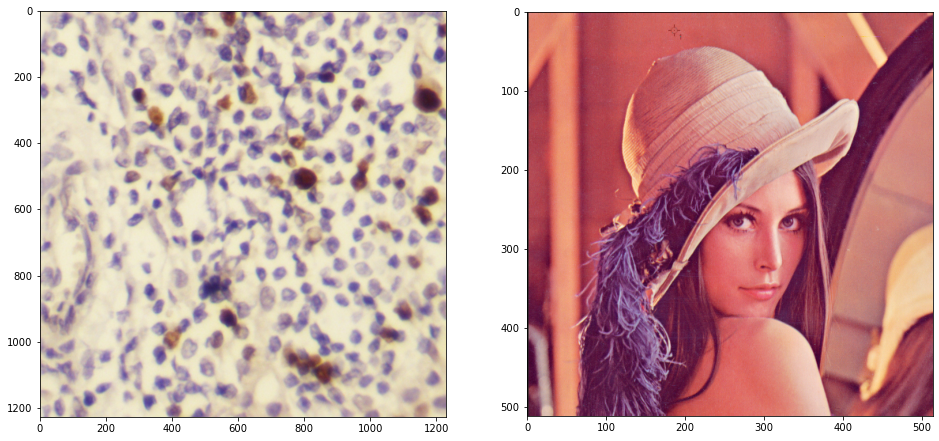

In [2]:
cells = cv2.imread('data/p1_0317_11.jpg')
lena = cv2.imread('data/Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

In [72]:
def plot_sifts(image: np.array, sifts):
    fig, axes = plt.subplots(4, 4, figsize=(25, 25))

    kps_sizes = []

    for (cTh, eTh, kps, _), ax in zip(sifts, axes.flatten()):
        sift_image = cv2.drawKeypoints(image, kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        ax.imshow(sift_image[..., ::-1])
        ax.axis("off")
        ax.set_title(f"ContrastTh={cTh}, EdgeTh={eTh}")
        
        kps_sizes.extend([(cTh, eTh, kp.size) for kp in kps])

    plt.plot()

    # Plotting stats
    kps_df = pd.DataFrame(kps_sizes, columns=["ContrastTh", "EdgeTh", "Size"])

    fig, axes = plt.subplots(1, 3, figsize=(25, 6))

    kps_count = kps_df.groupby([pd.Grouper("ContrastTh"), pd.Grouper("EdgeTh")]).count().reset_index()
    sns.heatmap(kps_count.pivot("ContrastTh", "EdgeTh", "Size"), annot=True, ax=axes[0])
    axes[0].set_title("Number of points")
    
    kps_mean = kps_df.groupby([pd.Grouper("ContrastTh"), pd.Grouper("EdgeTh")]).mean().reset_index()
    sns.heatmap(kps_mean.pivot("ContrastTh", "EdgeTh", "Size"), annot=True, ax=axes[1])
    axes[1].set_title("Point size: mean")

    kps_std = kps_df.groupby([pd.Grouper("ContrastTh"), pd.Grouper("EdgeTh")]).std().reset_index()
    sns.heatmap(kps_std.pivot("ContrastTh", "EdgeTh", "Size"), annot=True, ax=axes[2])
    axes[2].set_title("Point size: std")

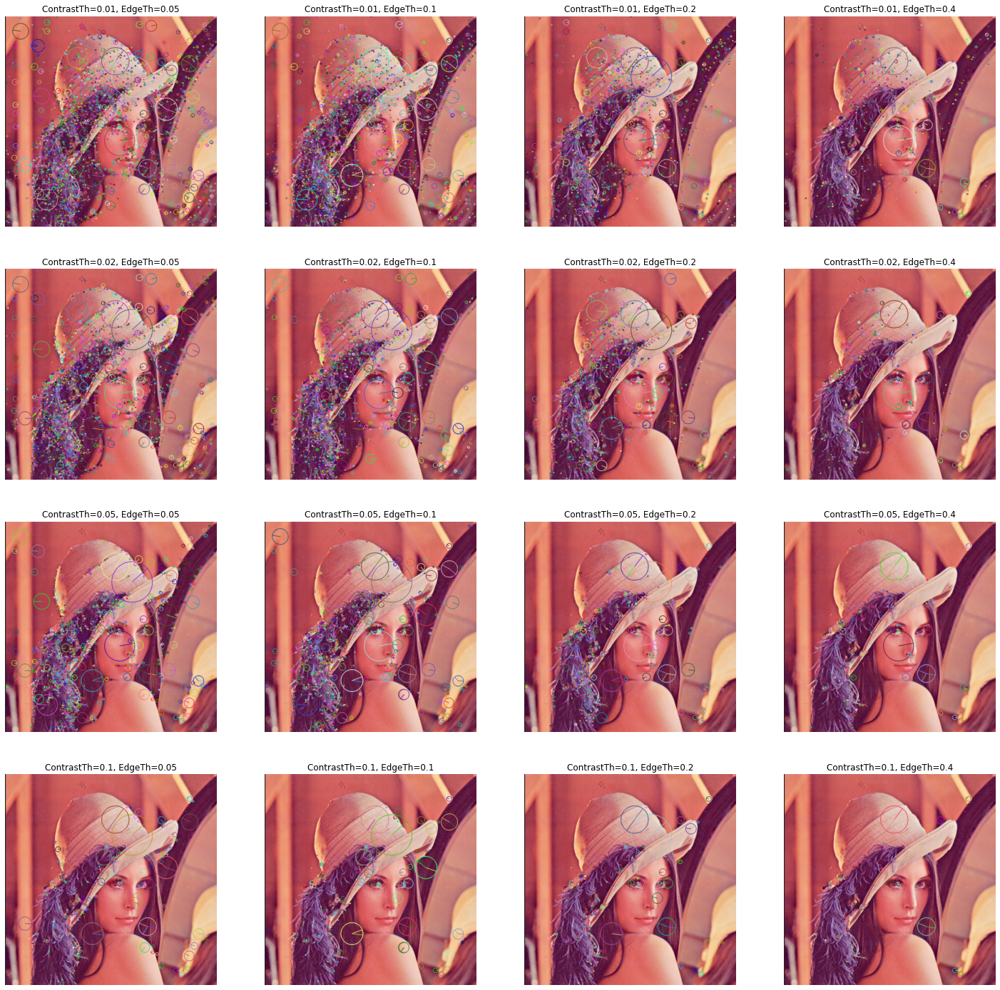

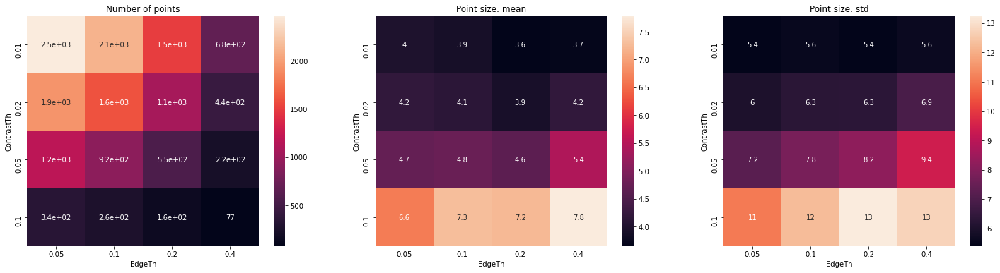

In [73]:
lena_sift = [
    (
        cTh, eTh, 
        *cv2.SIFT_create(contrastThreshold=cTh, edgeThreshold=eTh).detectAndCompute(lena, mask=None)
    )
    for cTh in [0.01, 0.02, 0.05, 0.1] for eTh in [0.05, 0.1, 0.2, 0.4]
]

plot_sifts(lena, lena_sift)

Punkty kluczowe znajdują się w tych samych miejscach niezależnie od wielkości progów - jedynie są odfiltrowywane większe lub mniejsze. Zarówno dla wzrostu progu kontrastu i krawędzi ilość punktów kluczowych maleje. W taki sam sposób rośnie średnia i odchylenie standardowe wielkości punktów. 

Zwiększanie progu krawędziowego sprawia, że wykrywamy mniej punktów w tle obrazu. Zwiększanie progu kontrastowego natomiast zdaje się eliminować głównie bardzo małe punkty .

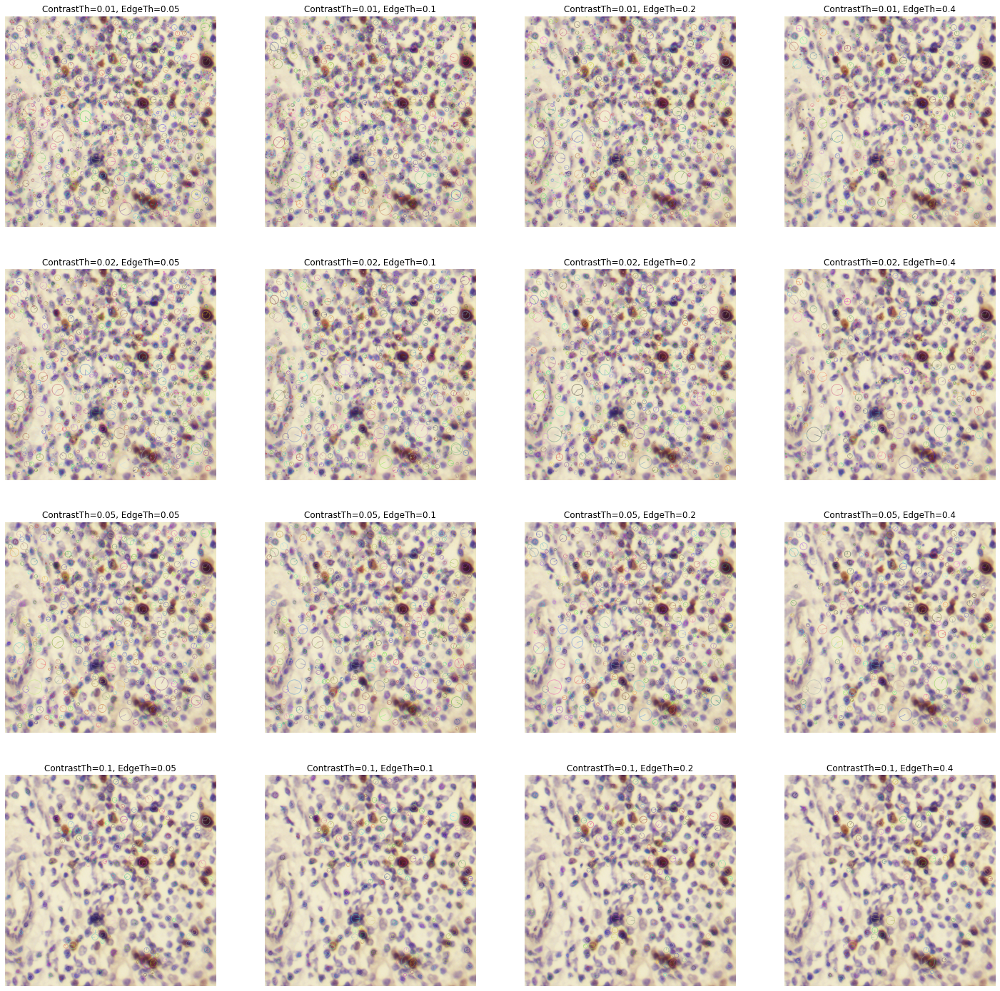

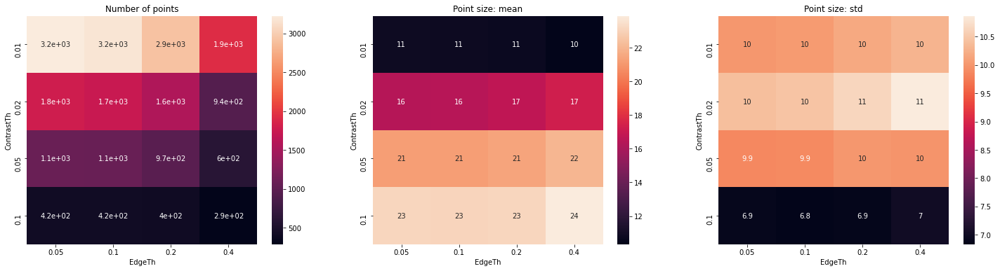

In [74]:
cells_sift = [
    (
        cTh, eTh, 
        *cv2.SIFT_create(contrastThreshold=cTh, edgeThreshold=eTh).detectAndCompute(cells, mask=None)
    )
    for cTh in [0.01, 0.02, 0.05, 0.1] for eTh in [0.05, 0.1, 0.2, 0.4]
]

plot_sifts(cells, cells_sift)

Dla obrazu `cells` widzimy podobne zachowanie statystyk punktów kluczowych jak w poprzednim przykładzie. Zauważamy także, średnia i odchylenie wielkości punktów kluczowych jest zależne głównie od progu kontrastowego. 

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [86]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

def plot_invariance_sifts(image: np.array, sifts):
    fig, axes = plt.subplots(4, 4, figsize=(25, 25))

    kps_sizes = []

    for (angle, scale, kps, _), ax in zip(sifts, axes.flatten()):
        sift_image = cv2.drawKeypoints(
            rotate(image, angle, scale=scale), kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
        )
        ax.imshow(sift_image[..., ::-1])
        ax.axis("off")
        ax.set_title(f"Angle={angle}, Scale={scale}")
        kps_sizes.extend([(angle, scale, kp.size) for kp in kps])

    plt.plot()

    # Plotting stats
    kps_df = pd.DataFrame(kps_sizes, columns=["Angle", "Scale", "Size"])

    fig, axes = plt.subplots(1, 3, figsize=(25, 6))

    kps_count = kps_df.groupby([pd.Grouper("Angle"), pd.Grouper("Scale")]).count().reset_index()
    sns.heatmap(kps_count.pivot("Angle", "Scale", "Size"), annot=True, ax=axes[0])
    axes[0].set_title("Number of points")
    
    kps_mean = kps_df.groupby([pd.Grouper("Angle"), pd.Grouper("Scale")]).mean().reset_index()
    sns.heatmap(kps_mean.pivot("Angle", "Scale", "Size"), annot=True, ax=axes[1])
    axes[1].set_title("Point size: mean")

    kps_std = kps_df.groupby([pd.Grouper("Angle"), pd.Grouper("Scale")]).std().reset_index()
    sns.heatmap(kps_std.pivot("Angle", "Scale", "Size"), annot=True, ax=axes[2])
    axes[2].set_title("Point size: std")

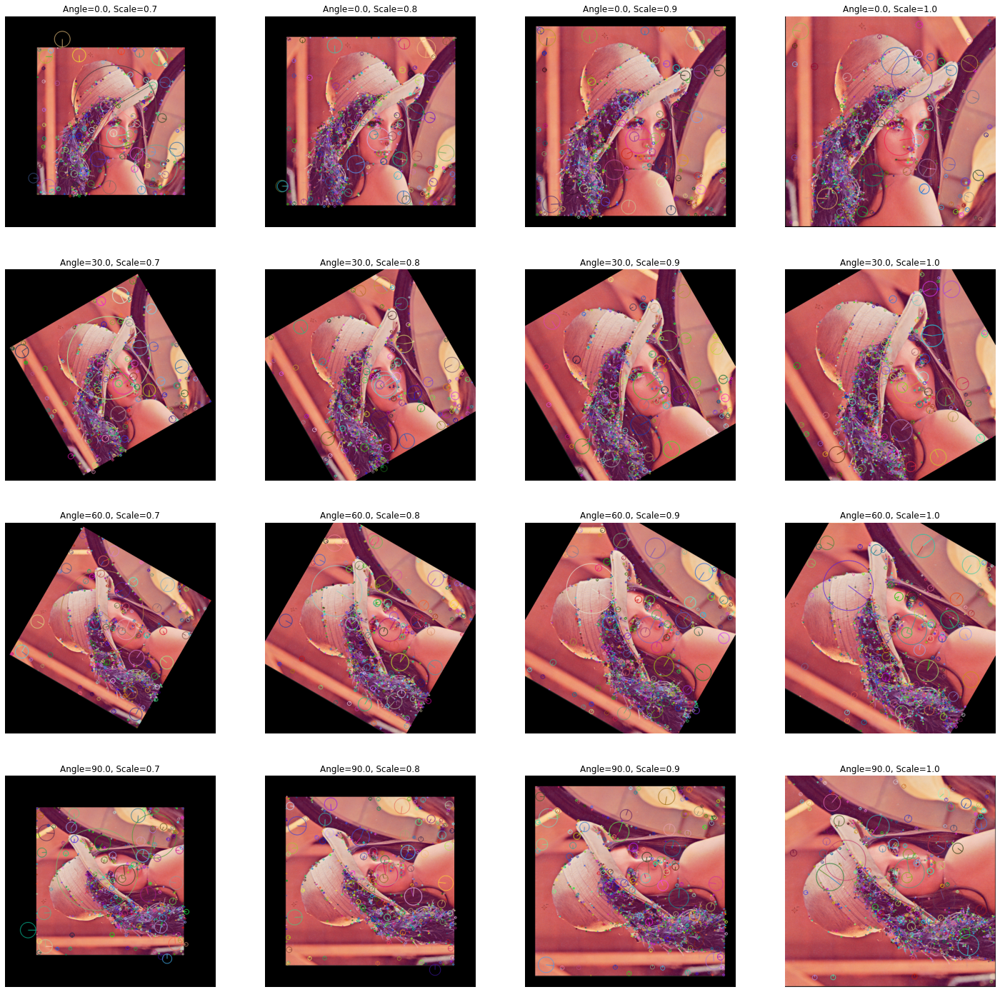

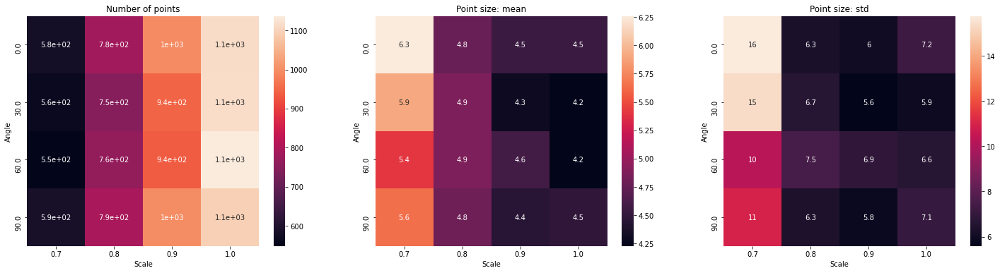

In [87]:
lena_invariance_sift = [
    (
        angle, scale, 
        *cv2.SIFT_create().detectAndCompute(rotate(lena, angle, scale=scale), mask=None)
    )
    for angle in [0.0, 30.0, 60.0, 90.0] for scale in [0.7, 0.8, 0.9, 1.0]
]

plot_invariance_sifts(lena, lena_invariance_sift)

Ewidentnie punkty nie są niezależne od rotacji i skali - nie dostajemy dokładnie tych samych punktów. Jednak ich lokalizacje zagęszczeń są dosyć podobne. Analizując statystyki widzimy także, że ilość punktów i ich rozmiar zależą głównie od skali. 

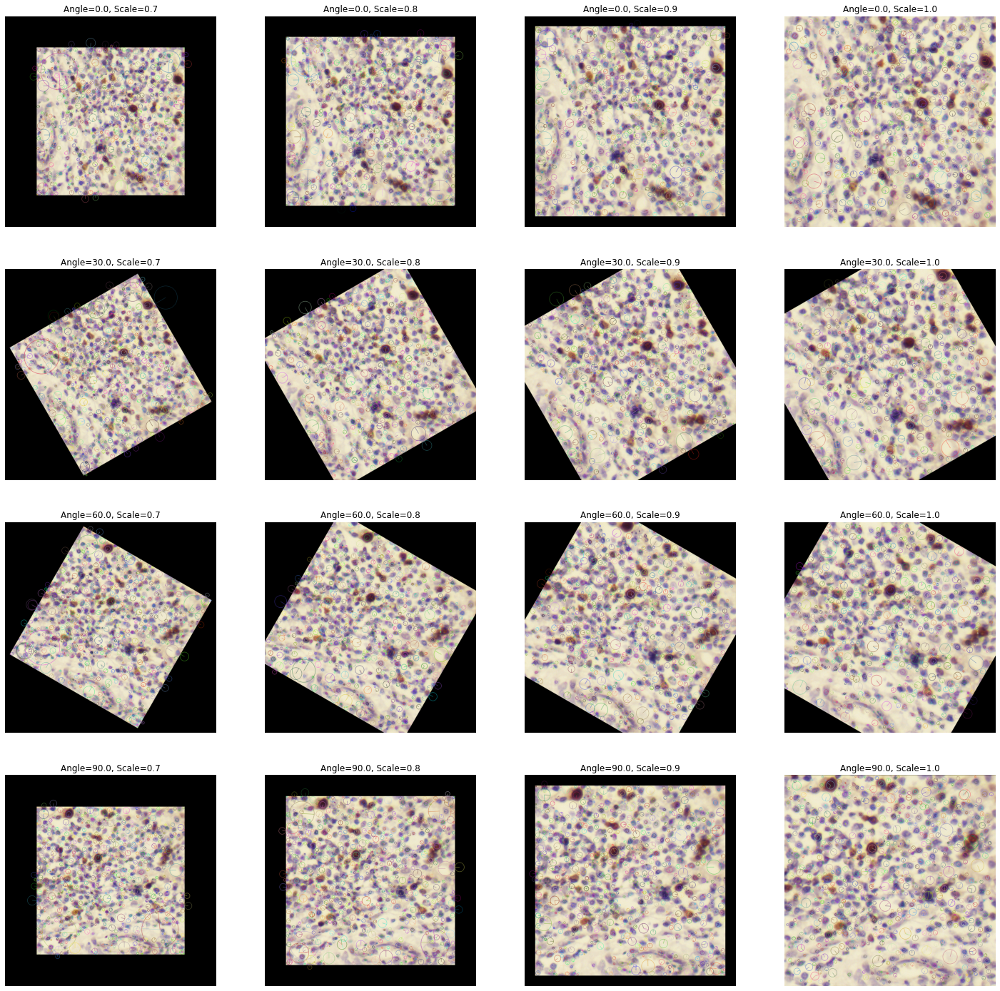

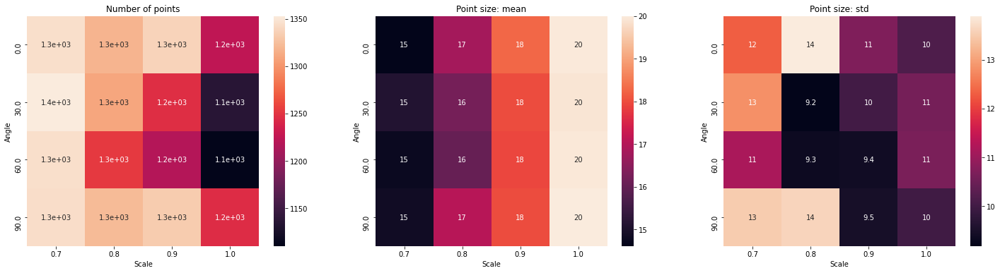

In [88]:
cells_invariance_sift = [
    (
        angle, scale, 
        *cv2.SIFT_create().detectAndCompute(rotate(cells, angle, scale=scale), mask=None)
    )
    for angle in [0.0, 30.0, 60.0, 90.0] for scale in [0.7, 0.8, 0.9, 1.0]
]

plot_invariance_sifts(cells, cells_invariance_sift)

Odmiennie niż dla poprzedniego przykładu, dla zdjęcia `cells` ilośc punktów jest największa dla mniejszej skali, a średnie wielkości punktów sa większe dla większej skali.